# Задание
**Цель:** изучить применение методов разведочного анализа данных (EDA) для улучшения качества работы моделей машинного обучения.

**Описание задания:**

В домашнем задании нужно улучшить метрики RMSE, R2 модели линейной регрессии путем работы с данными, а именно проведения разведочного анализа данных. В качестве датасета необходимо загрузить данные о недвижимости Калифорнии из библиотеки [sklearn.datasets](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html). Целевая переменная – MedHouseVal. Прочитать информацию о признаках датасета можно, выполнив следующий код – print(fetch_california_housing().DESCR).

In [1]:
#!pip install reverse_geocoder
#!pip install folium
#!pip install geopy

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from geopy.distance import geodesic as GD
import reverse_geocoder as revgc
import warnings
warnings.filterwarnings("ignore")

# 1. Получите данные и загрузите их в рабочую среду. (Jupyter Notebook или другую).

In [3]:
df = fetch_california_housing(as_frame=True).frame
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [4]:
print(fetch_california_housing().DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [5]:
df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   MedInc       20640 non-null  float64
 1   HouseAge     20640 non-null  float64
 2   AveRooms     20640 non-null  float64
 3   AveBedrms    20640 non-null  float64
 4   Population   20640 non-null  float64
 5   AveOccup     20640 non-null  float64
 6   Latitude     20640 non-null  float64
 7   Longitude    20640 non-null  float64
 8   MedHouseVal  20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


# 2. Проверьте данные на наличие пропусков. Удалите их в случае обнаружения.

In [7]:
df.isna().sum()

MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64

Пропуски в данных отсутствуют.

# 3. Разделите выборку на обучающее и тестовое подмножества. 80% данных оставить на обучающее множество, 20% - на тестовое.

In [8]:
X = df.iloc[:, :-1]
y = df.iloc[:, -1]
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [9]:
def train_test(X, y, train_size=0.8, random_state=42):
    return train_test_split(X, y, train_size=train_size, random_state=random_state)

In [10]:
X_train, X_test, y_train, y_test = train_test(X, y)

# 4. Постройте модель линейной регрессии. Вычислите метрики RMSE, R2 на обучающем и тестовом множестве.

In [11]:
def model(X, y, flag=False):
    
    X_train, X_test, y_train, y_test = train_test(X, y)
    lin_reg = LinearRegression(n_jobs=4)
    lin_reg.fit(X_train, y_train)
    
    if flag:
        return mean_squared_error( y_test, lin_reg.predict(X_test), squared=False ), r2_score( y_test, lin_reg.predict(X_test) )
    else:
        print(f'На обучающем множестве RMSE = {mean_squared_error( y_train, lin_reg.predict(X_train), squared=False )}, \
        R2 = {r2_score( y_train, lin_reg.predict(X_train) )}')
    
        print(f'На тестовом множестве RMSE = {mean_squared_error( y_test, lin_reg.predict(X_test), squared=False )}, \
        R2 = {r2_score( y_test, lin_reg.predict(X_test) )}')

In [12]:
model(X, y)
rmse_0, r2_0 = model(X, y, True)

На обучающем множестве RMSE = 0.7196757085831574,         R2 = 0.6125511913966952
На тестовом множестве RMSE = 0.7455813830127758,         R2 = 0.5757877060324514


# 5. Постройте график распределения целевой переменной. Сделайте вывод. Присутствуют ли в этом признаке выбросы?

<AxesSubplot:xlabel='MedHouseVal', ylabel='Count'>

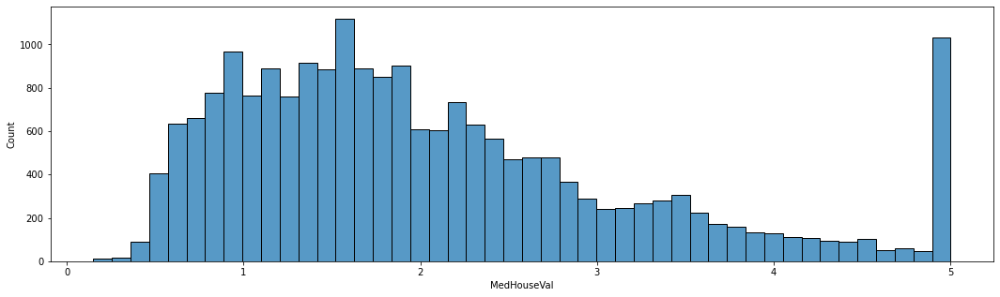

In [13]:
plt.figure(figsize=[18,5])
sns.histplot(y)

В данных отсутствуют выбросы. Распределение не является нормальным.

# 6. Посчитайте и выведите корреляционную матрицу. Убедитесь, что ячейки матрицы поделены на цветные категории, в ячейках указано числовое значение корреляции.

<AxesSubplot:>

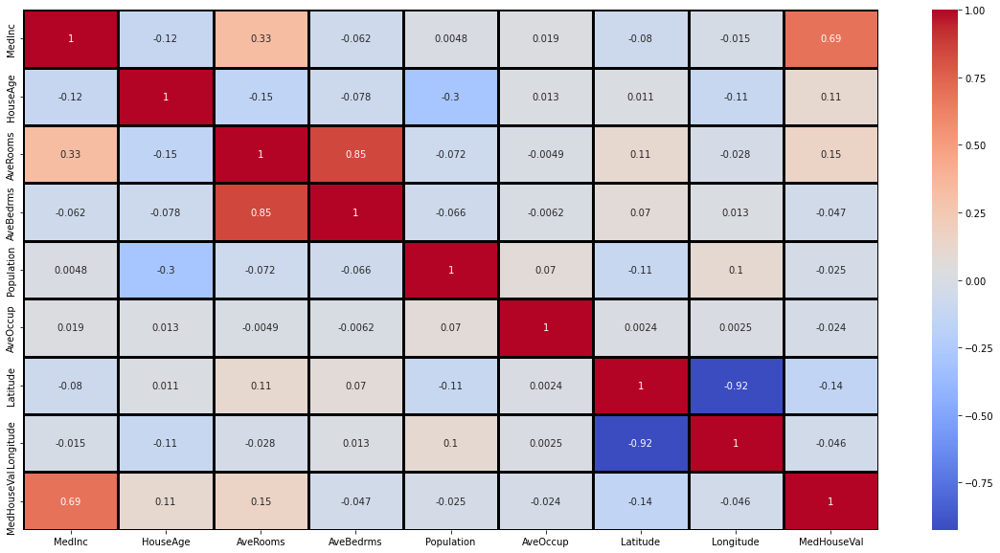

In [14]:
plt.figure(figsize=[20,10])
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', linewidths=3, linecolor='black')

### a. Сделайте выводы.

Полностью отсутствует корреляция между целевой переменной и признаками AveBedrms, Population, AveOccup, Longitude. Вероятно, данные признаки можно удалить.

Целевая переменная имеет среднюю корреляцию с медианным доходом домохозяйства.

### b. Удалите признаки на основании полученных значений, выводов.

Найдем комбинацию признаков для удаления, сильнее всего улучшающую метрики.

In [15]:
def search_cols(X, cols):
    
    rmse_train_best = 1e+10
    rmse_test_best = 1e+10
    r2_train_best = 0
    r2_test_best = 0
    best_cols_to_drop = []

    for col1 in cols:
        for col2 in cols:
            for col3 in cols:
                for col4 in cols:
                    cols_to_drop = set([col1, col2, col3, col4])
                    tmp_X = X.drop(cols_to_drop, axis=1)
                    
                    X_train, X_test, y_train, y_test = train_test(tmp_X, y)
                    lin_reg = LinearRegression(n_jobs=4)
                    lin_reg.fit(X_train, y_train)
                    rmse_train = mean_squared_error( y_train, lin_reg.predict(X_train), squared=False )
                    rmse_test = mean_squared_error( y_test, lin_reg.predict(X_test), squared=False )
                    r2_train = r2_score( y_train, lin_reg.predict(X_train) )
                    r2_test =r2_score( y_test, lin_reg.predict(X_test) )
                    
                    if rmse_test <= rmse_test_best or r2_test >= r2_test_best:
                        rmse_train_best = rmse_train
                        rmse_test_best = rmse_test
                        r2_train_best = r2_train
                        r2_test_best = r2_test
                        best_cols_to_drop = cols_to_drop

    print(f'Список колонок для удаления: {list(best_cols_to_drop)}')
    
    return X.drop(best_cols_to_drop, axis=1)

In [16]:
new_X = search_cols(X, ['AveBedrms', 'Population', 'AveOccup', 'Longitude'])

new_X.head()

Список колонок для удаления: ['AveBedrms']


,MedInc,HouseAge,AveRooms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,565.0,2.181467,37.85,-122.25


### c. Повторите п. 3, п. 4 на измененных данных.

In [17]:
model(X, y)
rmse_1, r2_1 = model(new_X, y, True)
col1 = list(new_X.columns)

На обучающем множестве RMSE = 0.7196757085831574,         R2 = 0.6125511913966952
На тестовом множестве RMSE = 0.7455813830127758,         R2 = 0.5757877060324514


# 7. Исследуйте оставленные признаки на выбросы.

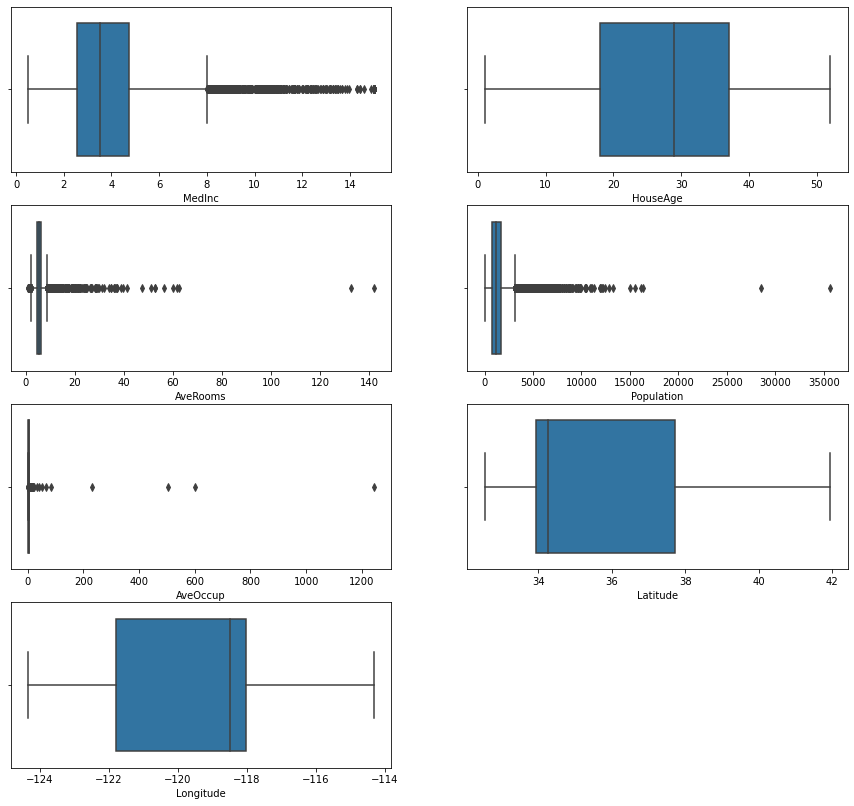

In [18]:
plt.figure(figsize=[15,14])

for i, j in zip(new_X.columns, range(len(new_X.columns))):
    plt.subplot(4, 2, j+1)
    sns.boxplot(new_X[i])

Столбцы AveRooms, Population, AveOccup имеют ярко выраженные выбросы.

### a. Удалите выбросы в случае обнаружения.

In [19]:
y = y.drop(index=new_X[(new_X['AveRooms'] > 45) | (new_X['Population'] > 20000) | (new_X['AveOccup'] > 200)].index)
new_X = new_X.drop(index=new_X[(new_X['AveRooms'] > 45) | (new_X['Population'] > 20000) | (new_X['AveOccup'] > 200)].index)
new_X = new_X.reset_index(drop=True)
new_X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20624 entries, 0 to 20623
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MedInc      20624 non-null  float64
 1   HouseAge    20624 non-null  float64
 2   AveRooms    20624 non-null  float64
 3   Population  20624 non-null  float64
 4   AveOccup    20624 non-null  float64
 5   Latitude    20624 non-null  float64
 6   Longitude   20624 non-null  float64
dtypes: float64(7)
memory usage: 1.1 MB


### b. Повторите п. 3, п. 4 на измененных данных.

In [20]:
model(new_X, y)
rmse_2, r2_2 = model(new_X, y, True)
col2 = list(new_X.columns)

На обучающем множестве RMSE = 0.7141027604099266,         R2 = 0.6170254728627209
На тестовом множестве RMSE = 0.7167866585900412,         R2 = 0.6135683240559053


# 8. Измените несколько признаков на выбор математически. Например, вычислите логарифм, возведите в квадрат, извлеките квадратный корень.

С помощью библиотеки reverse_geocoder добавим новые данные, полученные по координатам.

In [21]:
data = new_X[['Latitude', 'Longitude']]
coordinates = list(zip(data['Latitude'], data['Longitude']))
tmp = revgc.search(coordinates)
data[['name', 'admin2']] = pd.DataFrame(tmp)[['name', 'admin2']].copy()
data = pd.get_dummies(data, columns=['name', 'admin2'], drop_first=True)
data.head()

Loading formatted geocoded file...


,Latitude,Longitude,name_Adelanto,name_Agoura,name_Agoura Hills,name_Agua Dulce,name_Aguanga,name_Ahwahnee,name_Alameda,name_Alamo,...,admin2_Tehama County,admin2_Tijuana,admin2_Trinity County,admin2_Tulare County,admin2_Tuolumne County,admin2_Ventura County,admin2_Washoe County,admin2_Yolo County,admin2_Yuba County,admin2_Yuma County
0,37.88,-122.23,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,37.86,-122.22,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,37.85,-122.24,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,37.85,-122.25,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,37.85,-122.25,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
import folium
this_map = folium.Map(prefer_canvas=True)

def plotDot(point, color):
    
    folium.CircleMarker(
        location=[point.Latitude, point.Longitude],
        radius=2,
        weight=5,
        color=color,
    ).add_to(this_map)
    
data.apply(plotDot, axis=1, color='#3388FF')

this_map.fit_bounds(this_map.get_bounds())

this_map

Мы видим два крупных города - Лос-Анджелес и Сан-Франциско. Добавим колонки с расстоянием до этих городов.

In [23]:
los_ang = tuple([34.052365, -118.243746])
san_frc = tuple([37.774951, -122.419395])

In [24]:
tmp = pd.DataFrame()
tmp['geo'] = coordinates
new_X['dist_to_los'] = tmp.apply(lambda x: GD(x['geo'], los_ang).km, axis=1)
new_X['dist_to_san'] = tmp.apply(lambda x: GD(x['geo'], san_frc).km, axis=1)
model(new_X, y)

На обучающем множестве RMSE = 0.7108738019279599,         R2 = 0.6204810345242644
На тестовом множестве RMSE = 0.7130835839628629,         R2 = 0.6175507892082172


Реализуем кластеризацию по геоданным с подбором оптимального числа кластеров.

In [25]:
from sklearn.cluster import KMeans

def search_clusters(X):
    rmse_best = 1e+20
    r2_best = 0
    n_best = 0
    for i in range(1,21):
        clust = KMeans(n_clusters=i, random_state=42)

        new_X['geoclass'] = clust.fit_predict(X)
        tmp_X = new_X.copy()
        tmp_X = pd.get_dummies(data=tmp_X, columns=['geoclass'], drop_first=True)
        rmse_tmp, r2_tmp = model(tmp_X, y, True)
        
        if rmse_tmp < rmse_best and r2_tmp > r2_best:
            rmse_best = rmse_tmp
            r2_best = r2_tmp
            n_best = i
    print(n_best)
    return n_best

In [26]:
clust = KMeans(n_clusters=search_clusters(data), random_state=42)

new_X['geoclass'] = clust.fit_predict(data)

tmp['geoclass'] = new_X['geoclass']
new_X = pd.get_dummies(data=new_X, columns=['geoclass'], drop_first=True)
clust.score(data)

20


-26632.07962012535

In [27]:
model(new_X, y)

На обучающем множестве RMSE = 0.6632417049763807,         R2 = 0.6696364540259871
На тестовом множестве RMSE = 0.6626940220398337,         R2 = 0.6696920718840456


Добавим столбец с расстоянием до центра кластера, к которому относится строка.

In [28]:
centers = pd.DataFrame(clust.cluster_centers_)[[0, 1]]
centers['centers'] = centers[[0,1]].apply(tuple, axis=1)
centers.drop([0,1], axis=1, inplace=True)
centers['cluster'] = [i for i in range(len(centers))]
tmp = tmp.merge(centers, how='left', left_on='geoclass', right_on='cluster')
tmp.head()

,geo,geoclass,centers,cluster
0,"(37.88, -122.23)",9,"(37.738197044334974, -122.14591133004926)",9
1,"(37.86, -122.22)",9,"(37.738197044334974, -122.14591133004926)",9
2,"(37.85, -122.24)",9,"(37.738197044334974, -122.14591133004926)",9
3,"(37.85, -122.25)",9,"(37.738197044334974, -122.14591133004926)",9
4,"(37.85, -122.25)",9,"(37.738197044334974, -122.14591133004926)",9


In [29]:
new_X['distance_clust'] = tmp.apply(lambda x: GD(x['geo'], x['centers']).km, axis=1)
model(new_X, y)

На обучающем множестве RMSE = 0.6621706068318963,         R2 = 0.6707026296089091
На тестовом множестве RMSE = 0.6611697335749528,         R2 = 0.6712098327380168


In [30]:
new_X.describe()

,MedInc,HouseAge,AveRooms,Population,AveOccup,Latitude,Longitude,dist_to_los,dist_to_san,geoclass_1,...,geoclass_11,geoclass_12,geoclass_13,geoclass_14,geoclass_15,geoclass_16,geoclass_17,geoclass_18,geoclass_19,distance_clust
count,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,...,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000,20624.000000
mean,3.870656,28.641437,5.396603,1422.220471,2.946490,35.630168,-119.569453,269.113304,386.123965,0.280304,...,0.038693,0.033165,0.049166,0.007176,0.012316,0.008873,0.047081,0.028704,0.018231,26.297332
std,1.899626,12.585152,1.858337,1088.678908,1.221668,2.135191,2.003695,247.535303,250.060257,0.449159,...,0.192866,0.179072,0.216220,0.084409,0.110294,0.093781,0.211817,0.166979,0.133790,22.390376
min,0.499900,1.000000,0.846154,3.000000,0.692308,32.540000,-124.350000,0.434099,0.552101,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.133464
25%,2.563400,18.000000,4.440247,788.000000,2.430205,33.930000,-121.800000,32.054095,116.598104,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.126556
50%,3.534800,29.000000,5.227887,1166.000000,2.818426,34.260000,-118.490000,173.437279,525.908897,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,19.692485
75%,4.743250,37.000000,6.051005,1724.250000,3.282093,37.710000,-118.010000,526.723107,583.857850,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.869915
max,15.000100,52.000000,41.333333,16305.000000,83.171429,41.950000,-114.310000,1017.521320,903.344565,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,226.413255


In [31]:
def square(x):
    return x ** 2

In [32]:
def log(x):
    return np.log(x+1e-20)

In [33]:
def root(x):
    return x ** 0.5

In [34]:
def nothing(x):
    return x

In [35]:
def transform_col(x, col, foo, arg):
    if col == 'Longitude' and (arg == 'log' or arg == 'root'):
        x[col] = -np.abs(x[col]).apply(foo[arg])
    else:
        x[col] = x[col].apply(foo[arg])

In [36]:
def search_transform(X, cols=new_X.columns, flag=False):
    
    math_transforms = {'nothing': nothing, 'square': square, 'log': log, 'root': root}
    cols_transforms = []

    for col in cols:
        
        rmse_train_best = 1e+10
        rmse_test_best = 1e+10
        r2_train_best = 0
        r2_test_best = 0
        best_transform = None
        
        for transform in math_transforms.keys():
                        
            tmp_X = X.copy()
            
            transform_col(tmp_X, col, math_transforms, transform)
            
            X_train, X_test, y_train, y_test = train_test(tmp_X, y)
            
            lin_reg = LinearRegression(n_jobs=4)
            lin_reg.fit(X_train, y_train)
            rmse_train = mean_squared_error( y_train, lin_reg.predict(X_train), squared=False )
            rmse_test = mean_squared_error( y_test, lin_reg.predict(X_test), squared=False )
            r2_train = r2_score( y_train, lin_reg.predict(X_train) )
            r2_test =r2_score( y_test, lin_reg.predict(X_test) )
                    
            if rmse_test < rmse_test_best and r2_test > r2_test_best:
                rmse_train_best = rmse_train
                rmse_test_best = rmse_test
                r2_train_best = r2_train
                r2_test_best = r2_test
                best_transform = transform
        
        cols_transforms.append(f'{col}_{best_transform}')
        transform_col(new_X, col, math_transforms, best_transform)
        print(f'{col} - {best_transform}: rmse_test_best - {rmse_test_best}, r2_test_best - {r2_test_best}')
        
    if flag:
        return cols_transforms

In [37]:
cols_transforms = search_transform(new_X, flag=True)

MedInc - nothing: rmse_test_best - 0.6611697335749528, r2_test_best - 0.6712098327380168
HouseAge - square: rmse_test_best - 0.6603891557729914, r2_test_best - 0.6719857146169663
AveRooms - square: rmse_test_best - 0.6603466282409755, r2_test_best - 0.6720279599771125
Population - log: rmse_test_best - 0.66001326617906, r2_test_best - 0.6723590159210637
AveOccup - log: rmse_test_best - 0.6109704761078122, r2_test_best - 0.7192412238503016
Latitude - log: rmse_test_best - 0.6108121331358197, r2_test_best - 0.7193867314320737
Longitude - log: rmse_test_best - 0.6107897994037922, r2_test_best - 0.719407251741438
dist_to_los - root: rmse_test_best - 0.6099394468858417, r2_test_best - 0.7201880003941437
dist_to_san - log: rmse_test_best - 0.606855076192659, r2_test_best - 0.72301077827762
geoclass_1 - nothing: rmse_test_best - 0.606855076192659, r2_test_best - 0.72301077827762
geoclass_2 - log: rmse_test_best - 0.606855076192656, r2_test_best - 0.7230107782776227
geoclass_3 - nothing: rmse_

Добавим новый признак, сочетающий MedInc и AveOccup.

In [38]:
new_X['new'] = new_X['MedInc'] * new_X['AveOccup']

Так же добавим столбец с признаком MedInc в 3 степени, т.к. его корреляция с целевой переменной сильно выше остальных признаков.

In [39]:
new_X['MedInc3'] = new_X['MedInc'] ** 3
new_X.columns = cols_transforms + ['new', 'MedInc3']

### a. Повторите п. 3, п. 4 на измененных данных.

In [40]:
model(new_X, y)
rmse_3, r2_3 = model(new_X, y, True)

На обучающем множестве RMSE = 0.615067844500892,         R2 = 0.7158847726719764
На тестовом множестве RMSE = 0.6017258408822095,         R2 = 0.7276733040768594


# 9. Сформулируйте выводы по проделанной работе.

### a. Кратко опишите какие преобразования были сделаны с данными.

Были удалены признаки, не оказывающие положительного влияния на точность модели, удалены выбросы в оставшихся признаках, выполнены математические преобразования признаков.

### b. Сравните метрики всех моделей. Желательно оформление в виде таблицы вида |модель|RMSE|R2|признаки, на которых проводилось обучение с указанием их преобразований|.

In [41]:
models = ['Базовая', 'Уменьшение числа признаков', 'Удаление выбросов',
          'Математическое преобразование признаков']

features = [list(X.columns), col1,
            f'{col2}. Удалены выбросы в признаках AveRooms, Population, AveOccup',
           f'{cols_transforms}.']

final = {'Модель': models, 'RMSE': [rmse_0, rmse_1, rmse_2, rmse_3,], 'R2': [r2_0, r2_1, r2_2, r2_3],
         'Признаки, на которых проводилось обучение с указанием их преобразований': features}
pd.set_option('display.max_colwidth', None)
pd.DataFrame(final).head()

,Модель,RMSE,R2,"Признаки, на которых проводилось обучение с указанием их преобразований"
0,Базовая,0.745581,0.575788,"[MedInc, HouseAge, AveRooms, AveBedrms, Population, AveOccup, Latitude, Longitude]"
1,Уменьшение числа признаков,0.739815,0.582324,"[MedInc, HouseAge, AveRooms, Population, AveOccup, Latitude, Longitude]"
2,Удаление выбросов,0.716787,0.613568,"['MedInc', 'HouseAge', 'AveRooms', 'Population', 'AveOccup', 'Latitude', 'Longitude']. Удалены выбросы в признаках AveRooms, Population, AveOccup"
3,Математическое преобразование признаков,0.601726,0.727673,"['MedInc_nothing', 'HouseAge_square', 'AveRooms_square', 'Population_log', 'AveOccup_log', 'Latitude_log', 'Longitude_log', 'dist_to_los_root', 'dist_to_san_log', 'geoclass_1_nothing', 'geoclass_2_log', 'geoclass_3_nothing', 'geoclass_4_nothing', 'geoclass_5_nothing', 'geoclass_6_nothing', 'geoclass_7_nothing', 'geoclass_8_nothing', 'geoclass_9_nothing', 'geoclass_10_log', 'geoclass_11_nothing', 'geoclass_12_nothing', 'geoclass_13_nothing', 'geoclass_14_nothing', 'geoclass_15_log', 'geoclass_16_nothing', 'geoclass_17_nothing', 'geoclass_18_nothing', 'geoclass_19_nothing', 'distance_clust_log']."


### c. Напишите свое мнение, в полной ли мере модели справились с поставленной задачей.

В целом, по результатам работы, получены удовлетворительные метрики. Для получения более точных результатов рационально использовать более сложные модели, такие как случайный лес и градиентный бустинг.